In [1]:
import gym
import gym_sokoban
import numpy as np
import random
import copy
from collections import deque
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, InputLayer
import matplotlib.pyplot as plt
%matplotlib inline

# Imports specifically so we can render outputs in Jupyter.
from JSAnimation.IPython_display import display_animation
from matplotlib import animation
from IPython.display import display
from IPython.display import clear_output

from skimage import transform # Help us to preprocess the frames
from skimage.color import rgb2gray # Help us to gray our frames

In [2]:
def show_state(env, step=0, info=""):
    plt.figure(3)
    plt.clf()
    plt.imshow(env.render(mode='rgb_array'))
#     plt.title("%s | Step: %d %s" % (env._spec.id,step, info))
    plt.axis('off')

    clear_output(wait=True)
    display(plt.gcf())


def display_frames_as_gif(frames):
    """
    Displays a list of frames as a gif, with controls
    """
    #plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
    patch = plt.imshow(frames[0])
    plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(plt.gcf(), animate, frames = len(frames), interval=50)
    display(display_animation(anim, default_mode='loop'))

def preprocess_frame(frame):
    # Greyscale frame 
    gray = rgb2gray(frame)
    
    # Crop the screen (remove the part below the player)
    # [Up: Down, Left: right]
    cropped_frame = gray[8:-12,4:-12]
    
    # Normalize Pixel Values
    normalized_frame = cropped_frame/255.0
    
    # Resize
    # Thanks to Mikołaj Walkowiak
    preprocessed_frame = transform.resize(normalized_frame, [110,84])
    
    return preprocessed_frame # 110x84x1 frame

In [3]:
env = gym.make("SpaceInvaders-v0")

In [4]:
tf.reset_default_graph()

In [5]:
## PARAMETERS
frame_buffer_size = 4

hidden_neurons = [64, 64]

input_size = frame_buffer_size
for i in range(len(env.observation_space.shape)):
    input_size *= env.observation_space.shape[i]
    
action_size = env.action_space.n

## HYPER PARAMETERS
learning_rate = 0.00025


In [14]:
# Create Buffer
max_size = 10000

def PushToMemory(memory,element):
    memory.append(element)
    
    if len(memory) >= max_size:
        del memory[0]

class Memory():
    def __init__(self, max_size):
        self.buffer = deque(maxlen = max_size)
    
    def add(self, experience):
        self.buffer.append(experience)
    
    def sample(self, batch_size):
        buffer_size = len(self.buffer)
        index = np.random.choice(np.arange(buffer_size),
                                size = batch_size,
                                replace = True)
        
        return [self.buffer[i] for i in index]

memory = Memory(max_size)

In [7]:
class DQNetwork():
    def __init__(self, input_size, action_size, learning_rate=0.01):
        
        self.learning_rate = learning_rate
        self.input_size = input_size
        self.action_size = action_size
        
        self.inputs_ = tf.placeholder(shape=[None, self.input_size],dtype=tf.float32)

        # Remember that target_Q is the R(s,a) + ymax Qhat(s', a')
        self.target_Q = tf.placeholder(tf.float32, [None, self.action_size], name="target")

        self.fc1 = tf.layers.dense(inputs = self.inputs_,
                             units = 512,
                             activation = tf.nn.relu,
                             kernel_initializer=tf.contrib.layers.xavier_initializer(),
                             name="fc1")
        
        self.fc2 = tf.layers.dense(inputs = self.fc1,
                             units = 512,
                             activation = tf.nn.relu,
                             kernel_initializer=tf.contrib.layers.xavier_initializer(),
                             name="fc2")

        self.output = tf.layers.dense(inputs = self.fc2, 
                                 kernel_initializer=tf.contrib.layers.xavier_initializer(),
                                 units = self.action_size, 
                                 activation=None)



        # Q is our predicted Q values.
        self.Q = tf.argmax(self.output, 1)

        # The loss is the difference between our predicted Q_values and the Q_target
        # Sum(Qtarget - Q)^2
        self.loss = tf.reduce_mean(tf.square(self.target_Q - self.output))

        self.optimizer = tf.train.AdamOptimizer(self.learning_rate).minimize(self.loss)
        
        self.correct_prediction = tf.equal(tf.argmax(self.output, 1), tf.argmax(self.target_Q, 1))
        self.accuracy = tf.reduce_mean(tf.cast(self.correct_prediction, tf.float32))

In [10]:
tf.reset_default_graph()
network = DQNetwork(36960, action_size, learning_rate=0.00025)

# Setup TensorBoard Writer
writer = tf.summary.FileWriter("tensorboard/dqn/1")

## Losses
tf.summary.scalar("Loss", network.loss)

write_op = tf.summary.merge_all()

saver = tf.train.Saver()

In [19]:
# Set learning parameters
y = 0.99
e = 0.3
num_episodes = 1000
batch_size = 64

show_game = False

continue_training = True
max_steps = 50000

with tf.Session() as sess:
    
    if continue_training:
        saver.restore(sess, "./models/model.ckpt")
    else:
        init = tf.global_variables_initializer()
        sess.run(init)
        
    consecutive_rewards = []
    for i in range(num_episodes):
        #Reset environment and get first new observation
        s = env.reset()
        rAll = 0
        d = False
        num_actions = 0
        frames = []
        stacked_frames = []
        total_reward = 0
        
        gray_frame = preprocess_frame(s)
        for k in range(frame_buffer_size):
            stacked_frames.append(np.asmatrix(gray_frame.flatten()))
        
        #The Q-Network
        while num_actions < max_steps:
            num_actions+=1
            
            if show_game:
                show_state(env)
#             frames.append(env.render(mode = 'rgb_array'))
            
            #copy stacked frames
            c_stacked_frames = copy.deepcopy(stacked_frames)
            
            #allQ = model.predict(np.vstack(c_stacked_frames).flatten())
            
            allQ = sess.run(network.output,feed_dict={network.inputs_:np.vstack(c_stacked_frames).flatten()})
            if np.random.rand(1) < e:
                a = env.action_space.sample()
            else:
                #Choose an action by greedily (with e chance of random action) from the Q-network
                a = np.argmax(allQ)
                
            #Get new state and reward from environment
            s1,r,d,_ = env.step(a)
            
            total_reward += r
            
            #stack new frame
            del stacked_frames[0]
            gray_frame = preprocess_frame(s1)
            stacked_frames.append(np.asmatrix(gray_frame.flatten()))
            
            
            
            if d == True:
                #Reduce chance of random action as we train the model.
                e = 1./((i/50) + 10)
                
                targetQ = allQ
                num_actions = max_steps
            else:
                #Obtain the Q' values by feeding the new state through our network
                #Q1 = np.argmax(model.predict(np.vstack(stacked_frames).flatten()))
                Q1 = sess.run(network.output,feed_dict={network.inputs_:np.vstack(stacked_frames).flatten()})
                #Obtain maxQ' and set our target value for chosen action.
                maxQ1 = np.amax(Q1)
                targetQ = allQ
                targetQ[0,a] = r + y*maxQ1

            memory.add((np.vstack(c_stacked_frames).flatten(),targetQ))
            
            # BATCH LEARNING
            batch = memory.sample(batch_size)
            
            states = np.squeeze(np.array([each[0] for each in batch]), axis=1)
            targets = np.squeeze(np.array([each[1] for each in batch]), axis=1)
            
            
            
            loss,  _ = sess.run([network.loss,network.optimizer],
                              feed_dict={network.inputs_:states,
                                         network.target_Q:targets})
            s = s1
            
            # write summary
            summary = sess.run(write_op,
                              feed_dict={network.inputs_:states,
                                         network.target_Q:targets})
            writer.add_summary(summary, i)
            writer.flush()
                
                
        print("Episode " + str(i) + " ended." + 
                  "\n\t Loss = " + str(loss) + 
                  "\n\t Total Reward = " + str(total_reward))
        
#         consecutive_rewards.append(total_reward)
#         if len(consecutive_rewards) > 100:
#             del consecutive_rewards[0]
#             if sum(consecutive_rewards)/100 > 195:
#                 save_path = saver.save(sess, "./models/model.ckpt")
#                 print("Model Saved")
#                 break
            
        if i % 5 == 0:
            save_path = saver.save(sess, "./models/model.ckpt")
            print("Model Saved")
#         if total_reward>50:
#         display_frames_as_gif(frames)

INFO:tensorflow:Restoring parameters from ./models/model.ckpt
Episode 0 ended.
	 Loss = 1.9579593
	 Total Reward = 380.0
Model Saved
Episode 1 ended.
	 Loss = 2.8879137
	 Total Reward = 370.0
Episode 2 ended.
	 Loss = 1.1483512
	 Total Reward = 265.0
Episode 3 ended.
	 Loss = 1.5391798
	 Total Reward = 140.0
Episode 4 ended.
	 Loss = 1.6133986
	 Total Reward = 205.0
Episode 5 ended.
	 Loss = 1.6550031
	 Total Reward = 180.0
Model Saved
Episode 6 ended.
	 Loss = 1.0981236
	 Total Reward = 195.0
Episode 7 ended.
	 Loss = 0.8514681
	 Total Reward = 240.0
Episode 8 ended.
	 Loss = 0.7968015
	 Total Reward = 235.0
Episode 9 ended.
	 Loss = 13.066342
	 Total Reward = 235.0
Episode 10 ended.
	 Loss = 2.4090893
	 Total Reward = 185.0
Model Saved
Episode 11 ended.
	 Loss = 4.4789133
	 Total Reward = 180.0
Episode 12 ended.
	 Loss = 4.0952225
	 Total Reward = 550.0
Episode 13 ended.
	 Loss = 4.146057
	 Total Reward = 310.0
Episode 14 ended.
	 Loss = 3.3406699
	 Total Reward = 465.0
Episode 15 en

KeyboardInterrupt: 

INFO:tensorflow:Restoring parameters from ./models/model.ckpt
Episode 0 ended.
	 Total Reward = 410.0



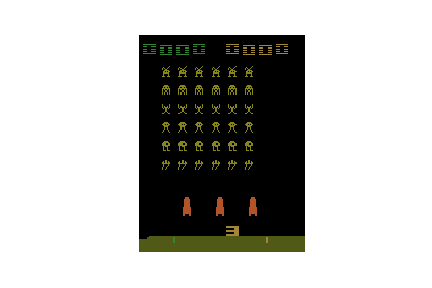
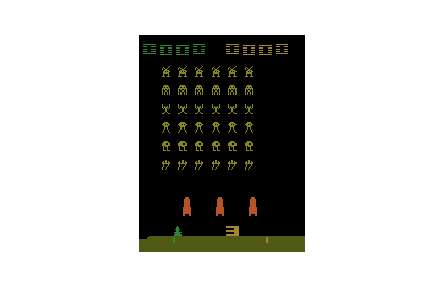
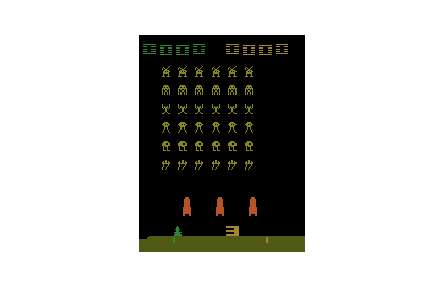
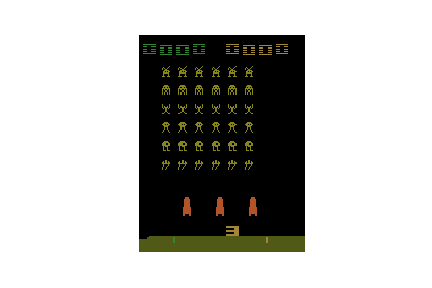
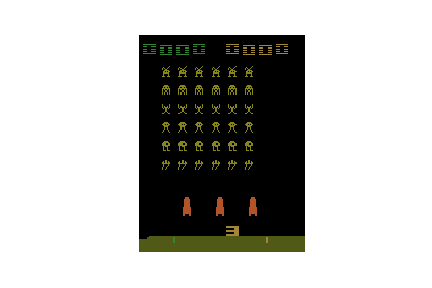
...
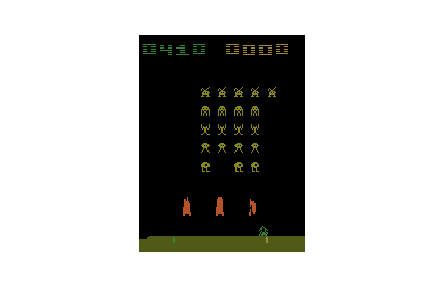
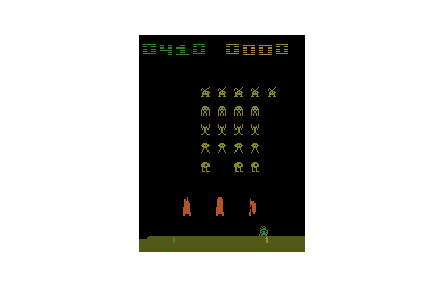
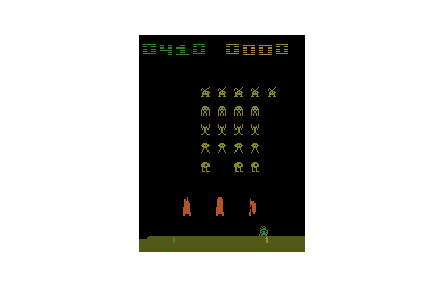
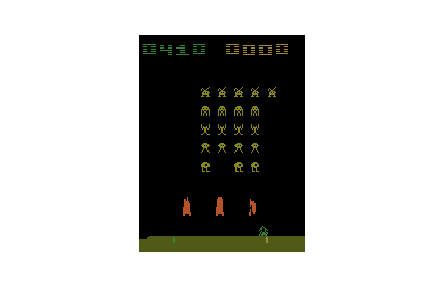
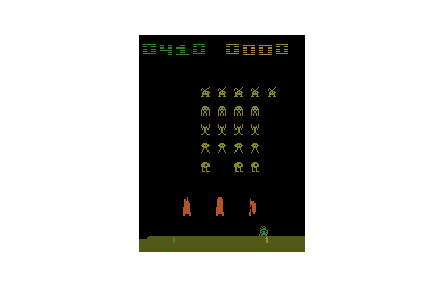

Episode 1 ended.
	 Total Reward = 480.0



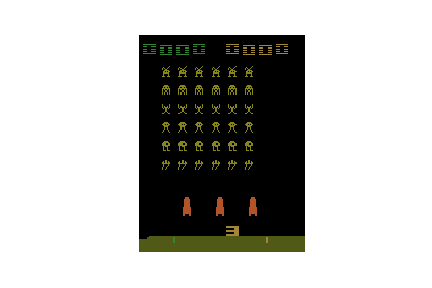
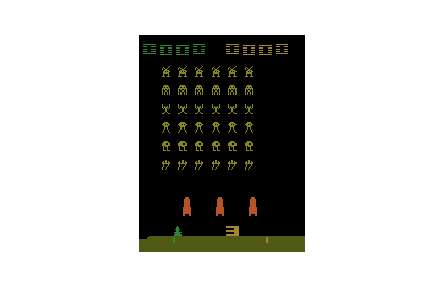
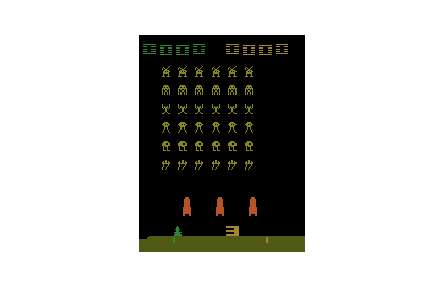
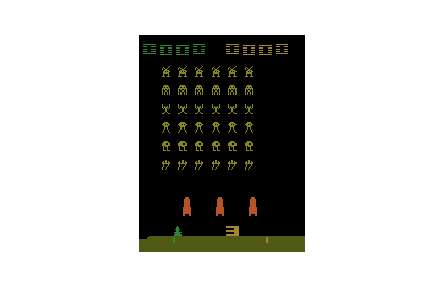
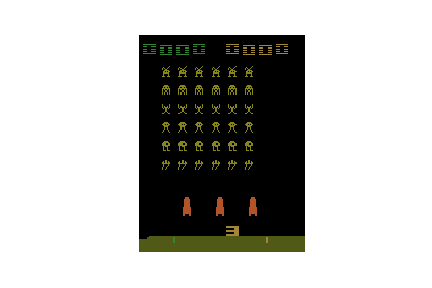
...
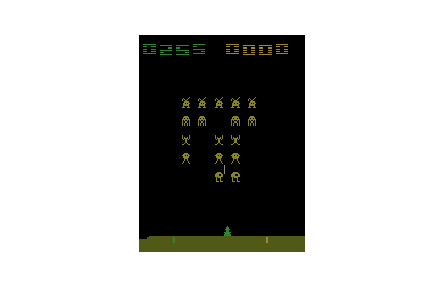
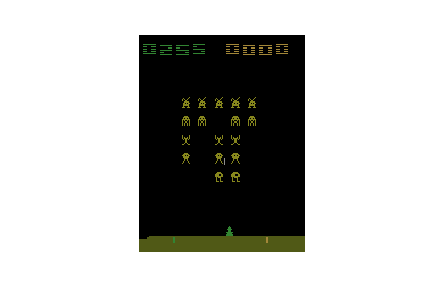
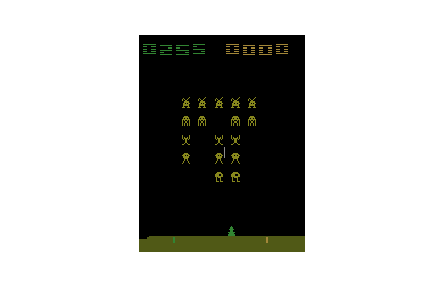
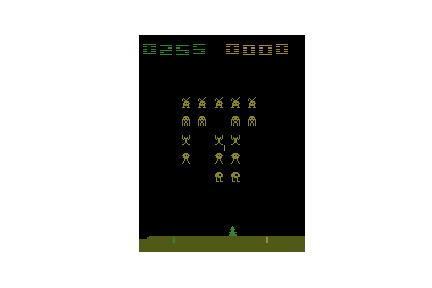
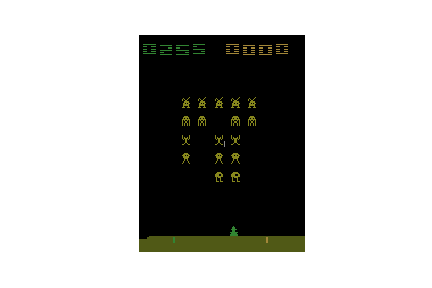

Episode 2 ended.
	 Total Reward = 235.0



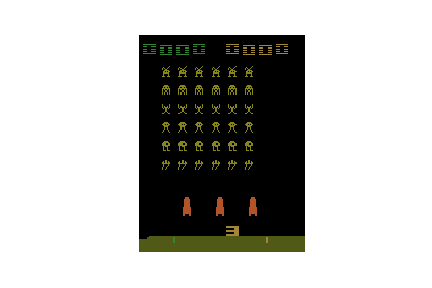
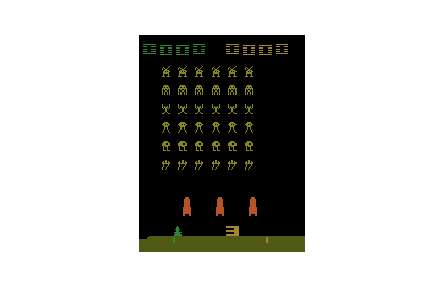
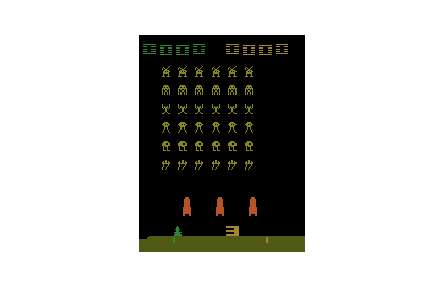
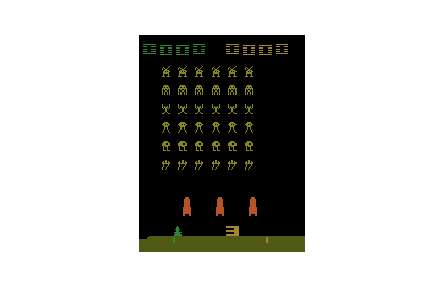
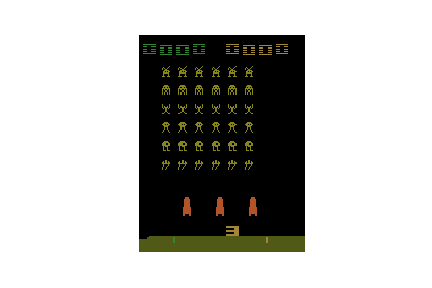
...
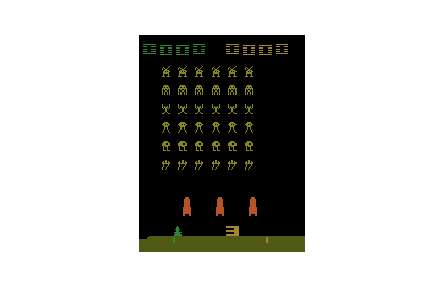
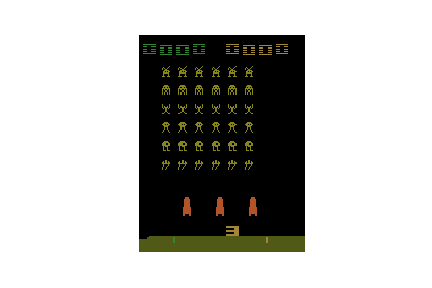
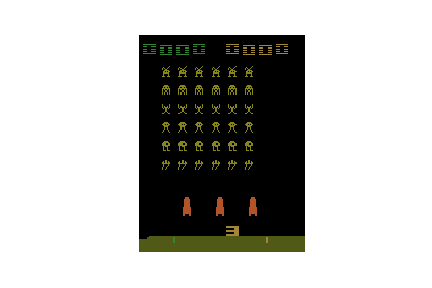
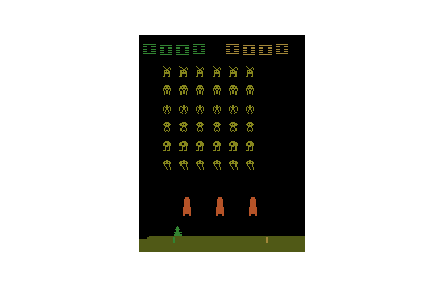
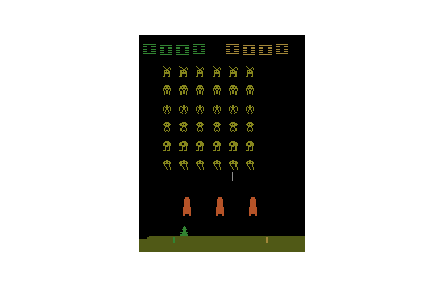

Episode 3 ended.
	 Total Reward = 205.0



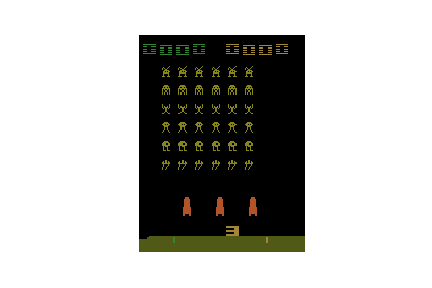
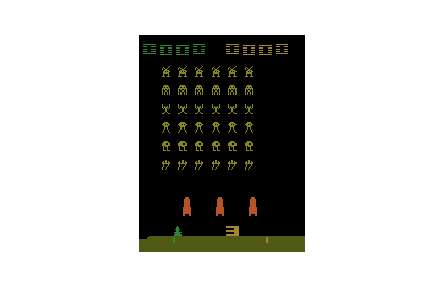
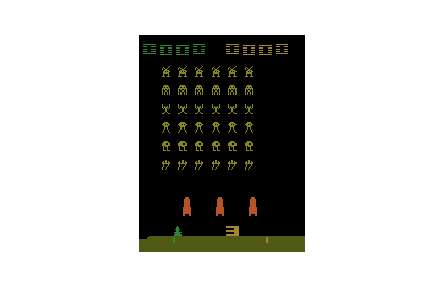
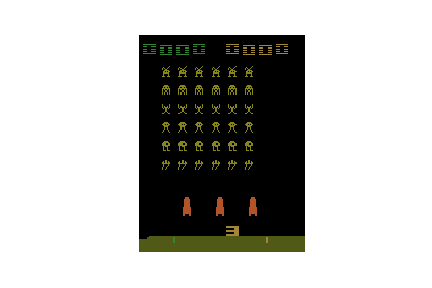
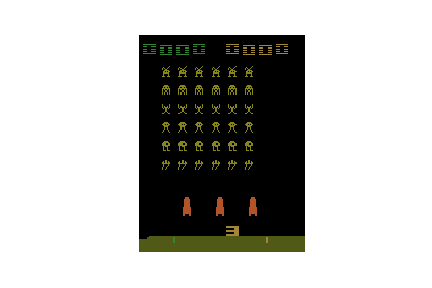
...
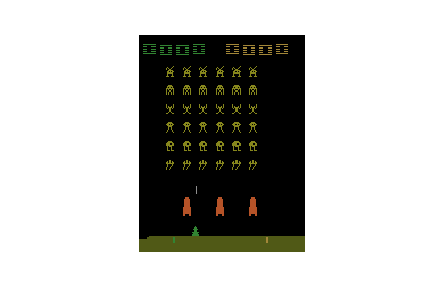
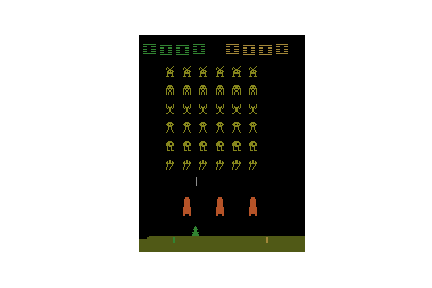
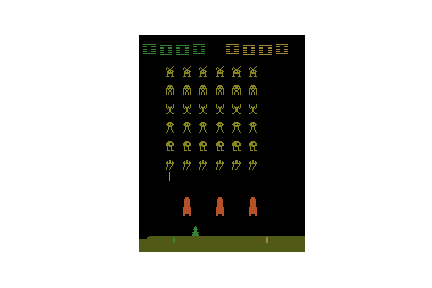
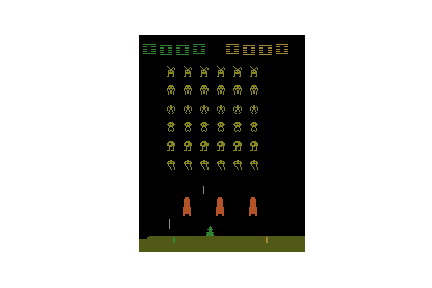
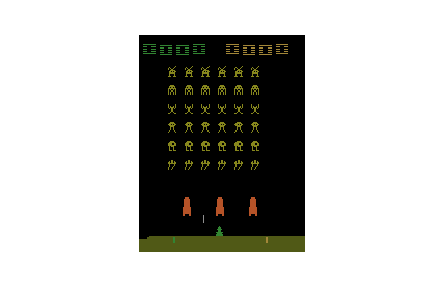

Episode 4 ended.
	 Total Reward = 230.0


KeyboardInterrupt: 

In [20]:
num_episodes = 100
show_game = True

with tf.Session() as sess:
    saver.restore(sess, "./models/model.ckpt")
    
    for i in range(num_episodes):
        #Reset environment and get first new observation
        s = env.reset()
        
        d = False
        num_actions = 0
        frames = []
        stacked_frames = []
        total_reward = 0
        
        gray_frame = preprocess_frame(s)
        for k in range(frame_buffer_size):
            stacked_frames.append(np.asmatrix(gray_frame.flatten()))
        
        #The Q-Network
        while not d:
            num_actions+=1
            
#             if show_game:
#                 show_state(env)
            frames.append(env.render(mode = 'rgb_array'))
            
            #copy stacked frames
            c_stacked_frames = copy.deepcopy(stacked_frames)
            
            #allQ = model.predict(np.vstack(c_stacked_frames).flatten())
            
            allQ = sess.run(network.output,
                                 feed_dict={network.inputs_:np.vstack(c_stacked_frames).flatten()})
            a = np.argmax(allQ)
                
            #Get new state and reward from environment
            s1,r,d,_ = env.step(a)
            
            total_reward += r
            
            #stack new frame
            del stacked_frames[0]
            gray_frame = preprocess_frame(s1)
            stacked_frames.append(np.asmatrix(gray_frame.flatten()))
        
        print("Episode " + str(i) + " ended." + 
                  "\n\t Total Reward = " + str(total_reward))
        display_frames_as_gif(frames)

In [37]:
from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets("mnist", one_hot=True)

Extracting mnist/train-images-idx3-ubyte.gz
Extracting mnist/train-labels-idx1-ubyte.gz
Extracting mnist/t10k-images-idx3-ubyte.gz
Extracting mnist/t10k-labels-idx1-ubyte.gz


In [38]:
tf.reset_default_graph()
network = DQNetwork(10,784, learning_rate=0.001)

sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

steps = 10000
for i in range(steps):
# Get the next batch
   input_batch, labels_batch = mnist.train.next_batch(100)
   feed_dict = {network.inputs_: input_batch, network.target_Q: labels_batch}

   # Print the current batch accuracy every 100 steps
   if i%100 == 0:
      train_accuracy = network.accuracy.eval(feed_dict=feed_dict)
      print("Step %d, training batch accuracy %g"%(i, train_accuracy))

   # Run the optimization step
   network.optimizer.run(feed_dict=feed_dict)

# Print the test accuracy once the training is over
test_images, test_labels = mnist.test.images, mnist.test.labels
print("Test accuracy: %g"%network.accuracy.eval(feed_dict={network.inputs_: test_images, network.target_Q: test_labels}))

Step 0, training batch accuracy 0.12
Step 100, training batch accuracy 0.91
Step 200, training batch accuracy 0.91
Step 300, training batch accuracy 0.91
Step 400, training batch accuracy 0.94
Step 500, training batch accuracy 0.93
Step 600, training batch accuracy 0.95
Step 700, training batch accuracy 0.94
Step 800, training batch accuracy 0.94
Step 900, training batch accuracy 0.94
Step 1000, training batch accuracy 0.93
Step 1100, training batch accuracy 0.95
Step 1200, training batch accuracy 0.97
Step 1300, training batch accuracy 0.93
Step 1400, training batch accuracy 0.97
Step 1500, training batch accuracy 0.99
Step 1600, training batch accuracy 0.95
Step 1700, training batch accuracy 0.97
Step 1800, training batch accuracy 0.94
Step 1900, training batch accuracy 0.99
Step 2000, training batch accuracy 0.95
Step 2100, training batch accuracy 0.97
Step 2200, training batch accuracy 0.99
Step 2300, training batch accuracy 0.95
Step 2400, training batch accuracy 0.98
Step 2500, t